# IMPORTS

In [1]:
%load_ext autoreload

import os
os.environ["JAX_PLATFORM_NAME"] = "cpu"

import jax
import jax.numpy as jnp

import tol_colors as tc
import matplotlib.pyplot as plt
import plotting_tools.basic_plotting_tools as pts
colors = pts.set_plot_style(default_cmap=tc.sunset)
%matplotlib widget

In [2]:
from scipy.spatial import Delaunay

import differential_geometry.manifolds as manifolds
import differential_geometry.charts as charts
import differential_geometry.aux_charts as aux_charts
import differential_geometry.functions as functions
import differential_geometry.curves as curves
import differential_geometry.fields as fields

import plotting_tools.plot_manifolds as plot_manifolds
import plotting_tools.plot_charts as plot_charts
import plotting_tools.plot_functions as plot_functions
import plotting_tools.plot_curves as plot_curves
import plotting_tools.plot_covectors as plot_covectors
import plotting_tools.plot_fields as plot_fields

save_dir = "../../saved_figures_and_videos/"

# 1. The manifold and the charts

$\mathcal{M}$ is the graph of $h(a,b) = \cos a \cos b + 1$. The chart $(\mathcal{U}, \mathscr{X})$ is
the projection $(a,b,c) \mapsto (a,b)$ and $(\mathcal{V}, \mathscr{Y})$ its polar version, defined
off the closed ray $\{a \leq 0, b = 0\}$. To visualize how each chart maps a piece of $\mathcal{M}$,
two overlapping elliptic regions are drawn, both chosen away from the branch cut and from the
origin.

In [3]:
def embedding(params):
    a, b = params
    return jnp.stack([a, b, jnp.cos(a) * jnp.cos(b) + 1.])

manifold = manifolds.Manifold(name=r"$\mathcal{M}$", dim=2, ambient_dim=3, embedding_func=embedding)

lambdas = jnp.linspace(0, 2 * jnp.pi, 600)
chart_U = charts.Chart(
    name="U", manifold=manifold,
    boundary=aux_charts.boundary_ellipse_in_param_space(lambdas, center=jnp.array([-1.1, -2.1]), axes=(3.5, 2.0)),
    chart_map=aux_charts.cartesian_chart_map,
    inverse_chart_map=aux_charts.inverse_cartesian_chart_map,
)
chart_V = charts.Chart(
    name="V", manifold=manifold,
    boundary=aux_charts.boundary_ellipse_in_param_space(lambdas, center=jnp.array([2.6, 0.5]), axes=(2.5, 3.5)),
    chart_map=lambda params: aux_charts.polar_chart_map(params, center=(0., 0.)),
    inverse_chart_map=lambda chart_coords: aux_charts.inverse_polar_chart_map(chart_coords, center=(0., 0.)),
)

# === Plotted window: (a, b) in [-L, L]^2, and the corresponding windows in each chart ===
# (Y(V) is open: r > 0 and theta in (-pi, pi), hence the small margin eps)
L, eps = 7.0, 1e-3
chart_panels = [
    # (chart, name, chart symbol, (xlim, ylim) in chart coordinates)
    (chart_U, "U", r"\mathscr{X}", ((-L, L), (-L, L))),
    (chart_V, "V", r"\mathscr{Y}", ((0.1, 10.), (-jnp.pi + eps, jnp.pi - eps))),
]

def manifold_axes(function=None, cmap=None, label_function=None):
    """3D axis with the manifold drawn on it (optionally colored by a scalar field)."""
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    plot_manifolds.plot_manifold(
        ax=ax, manifold=manifold, xmin=-L, xmax=L, ymin=-L, ymax=L, color=colors[-1], alpha=0.2,
        function=function, cmap=cmap, label_function=label_function,
        inset_position=(0.3, 0.9), inset_size=(3.5, 0.2),
    )
    ax.view_init(elev=40.0, azim=-50.0)
    ax.set_box_aspect([1, 1, 0.4])
    return fig, ax

def chart_sampling(chart, window, n=128):
    """Regular grid in chart coordinates pulled back to M, with its triangulation (no branch-cut triangles)."""
    chart_points = plot_fields.param_grid(*window, n)
    return jax.vmap(chart.inverse_chart_map)(chart_points), Delaunay(chart_points).simplices

def finish_chart_panel(fig, ax, window, symbol, file_name):
    ax.set(xlim=window[0], ylim=window[1], xlabel=rf"${symbol}^1$", ylabel=rf"${symbol}^2$")
    ax.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.show()
    fig.savefig(save_dir + file_name)

ERROR:2026-09-25 11:33:18,154:jax._src.xla_bridge:444: Jax plugin configuration error: Exception when calling jax_plugins.xla_cuda12.initialize()
Traceback (most recent call last):
  File "/home/dlopez/.miniconda3/envs/diff_geom/lib/python3.10/site-packages/jax_plugins/xla_cuda12/__init__.py", line 197, in _version_check
    version = get_version()
RuntimeError: jaxlib/cuda/versions_helpers.cc:81: operation cusparseGetProperty(MAJOR_VERSION, &major) failed: The cuSPARSE library was not found.

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/home/dlopez/.miniconda3/envs/diff_geom/lib/python3.10/site-packages/jax/_src/xla_bridge.py", line 442, in discover_pjrt_plugins
    plugin_module.initialize()
  File "/home/dlopez/.miniconda3/envs/diff_geom/lib/python3.10/site-packages/jax_plugins/xla_cuda12/__init__.py", line 324, in initialize
    _check_cuda_versions(raise_on_first_error=True)
  File "/home/dlopez/.miniconda3/envs/

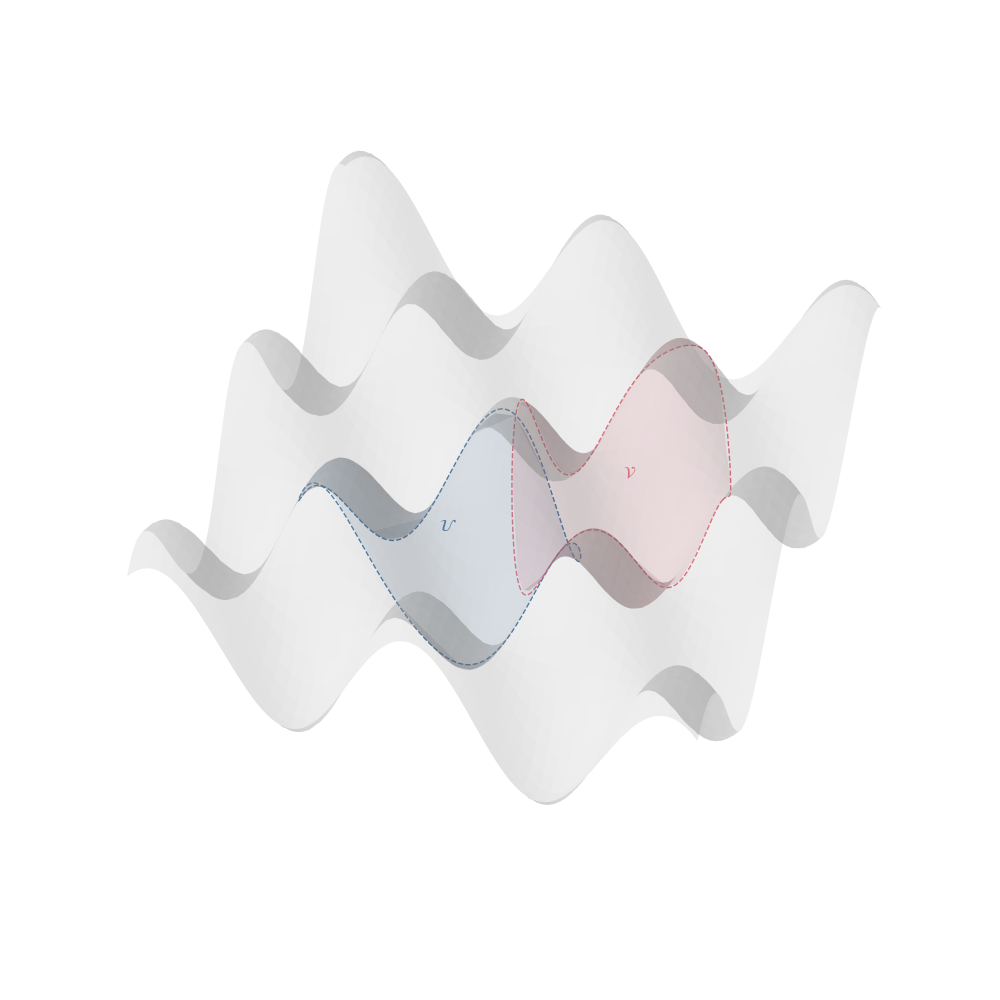

In [4]:
fig, ax = manifold_axes()
plot_charts.plot_chart_region_manifold(ax=ax, surface_manifold=manifold, chart=chart_U, color=colors[0], label=r"$\mathcal{U}$")
plot_charts.plot_chart_region_manifold(ax=ax, surface_manifold=manifold, chart=chart_V, color=colors[1], label=r"$\mathcal{V}$")
ax.view_init(elev=50.0, azim=-70.0)
plt.tight_layout()
plt.show()
fig.savefig(save_dir + "Fig_Example_charts_manifold.pdf")

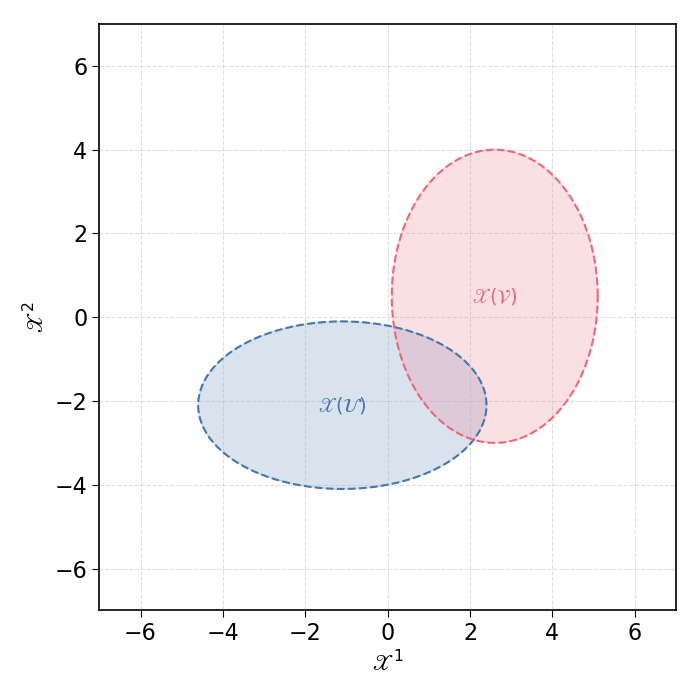

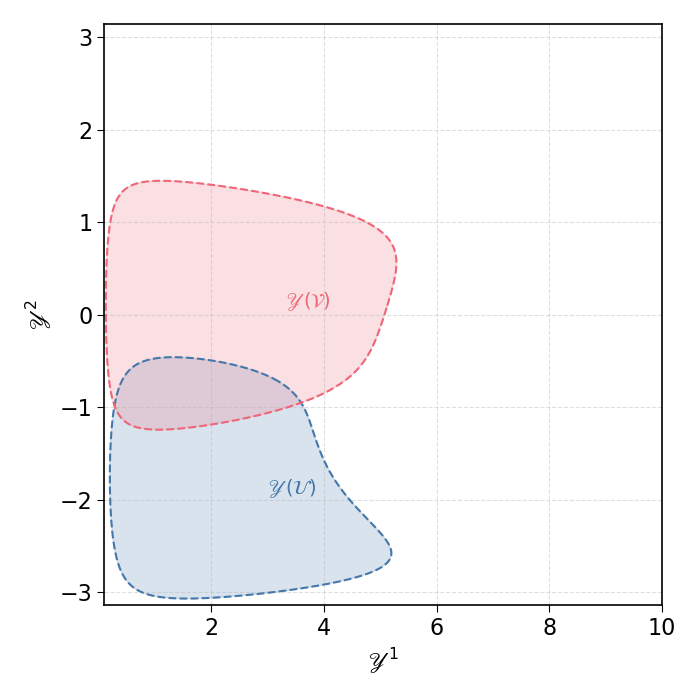

In [5]:
for chart, name, symbol, window in chart_panels:
    fig, ax = plt.subplots(figsize=(7, 7))
    for region, color in [(chart_U, colors[0]), (chart_V, colors[1])]:
        plot_charts.plot_parametric_region_in_chart_coordinates(
            ax=ax, chart=chart, param_space_data=region.boundary_curve, color=color,
            label=rf"${symbol}(\mathcal{{{region.name}}})$",
        )
    finish_chart_panel(fig, ax, window, symbol, f"Fig_Example_charts_{name}.pdf")

# 2. Curves and velocities

$\gamma_{x_0}(\lambda) = (x_0, \lambda)$ and $\delta_{r_0}(\lambda) = (r_0\cos\lambda, r_0\sin\lambda)$,
with $x_0 \in \{-3\pi/2, 2\pi\}$ and $r_0 \in \{3\pi/2, \pi/3\}$. The chart $\mathscr{Y}$ only sees
each curve on the parameter intervals where it stays inside $\mathcal{V}$: $\gamma_{-3\pi/2}$ crosses
the branch cut at $\lambda = 0$, and $\delta_{r_0}$ is drawn for $\lambda \in (-\pi, \pi)$.

In [6]:
def gamma_x(x0):
    return curves.Curve(manifold, lambda lam: jnp.stack([x0 * jnp.ones_like(lam), lam]))

def delta(r0):
    return curves.Curve(manifold, lambda lam: r0 * jnp.stack([jnp.cos(lam), jnp.sin(lam)]))

def point_on_delta(r0, x_p):
    """Point of delta_{r0} with first coordinate a = x_p (upper half, b > 0), and the lambda at which delta_{r0} reaches it."""
    if abs(x_p) >= r0:
        raise ValueError(f"delta_r0 never reaches a = {x_p}: |x_p| must be smaller than r0 = {float(r0):.3f}.")
    lambda_p = jnp.arccos(x_p / r0)
    return r0 * jnp.stack([jnp.cos(lambda_p), jnp.sin(lambda_p)]), lambda_p

def gamma_line(point, slope):
    """
    Straight line through `point` with the given slope, at unit speed, so that gamma(0) = point.
    Also returns its lambda intervals inside the window [-L, L]^2, as seen by (U, X) and by (V, Y):
    the latter are split where the line crosses the branch cut {a <= 0, b = 0}.
    """
    direction = jnp.array([1., slope]) / jnp.sqrt(1. + slope**2)
    line = curves.Curve(manifold, lambda lam: point + lam * direction)

    exits = jnp.sort(jnp.stack([(-L - point) / direction, (L - point) / direction]), axis=0)
    lam_min, lam_max = float(exits[0].max()), float(exits[1].min())
    intervals_U = [(lam_min, lam_max)]

    lam_cut = float(-point[1] / direction[1])     # where the line crosses b = 0 (inf if horizontal)
    crosses_cut = lam_min < lam_cut < lam_max and float(point[0] + lam_cut * direction[0]) <= 0.
    intervals_V = [(lam_min, lam_cut - eps), (lam_cut + eps, lam_max)] if crosses_cut else intervals_U

    return line, intervals_U, intervals_V

# === Intersection point p of the line with delta_{pi}, fixed by its first coordinate ===
r0, x_p, slope = jnp.pi + 0.3, 2.0, 1.0
p_line, lambda_p = point_on_delta(r0, x_p)          # p = delta_{r0}(lambda_p) = gamma_line(0)
line, line_intervals_U, line_intervals_V = gamma_line(p_line, slope)

curve_list = [
    # (curve, color, label, lambda intervals seen by (U, X), lambda intervals seen by (V, Y))
    (gamma_x(-3 * jnp.pi / 2), colors[2], r"$\gamma_{x_0=-3\pi/2}$", [(-L, L)], [(-L, -eps), (eps, L)]),
    (gamma_x(2 * jnp.pi),      colors[3], r"$\gamma_{x_0=2\pi}$",    [(-L, L)], [(-L, L)]),
    (line,                     colors[4], rf"$\gamma_{{m={slope:g}}}$", line_intervals_U, line_intervals_V),
    (delta(r0),                colors[5], r"$\delta_{\pi}$",         [(-jnp.pi, jnp.pi)], [(-jnp.pi, jnp.pi)]),
    (delta(jnp.pi / 3),        colors[6], r"$\delta_{\pi/3}$",       [(-jnp.pi, jnp.pi)], [(-jnp.pi, jnp.pi)]),
]

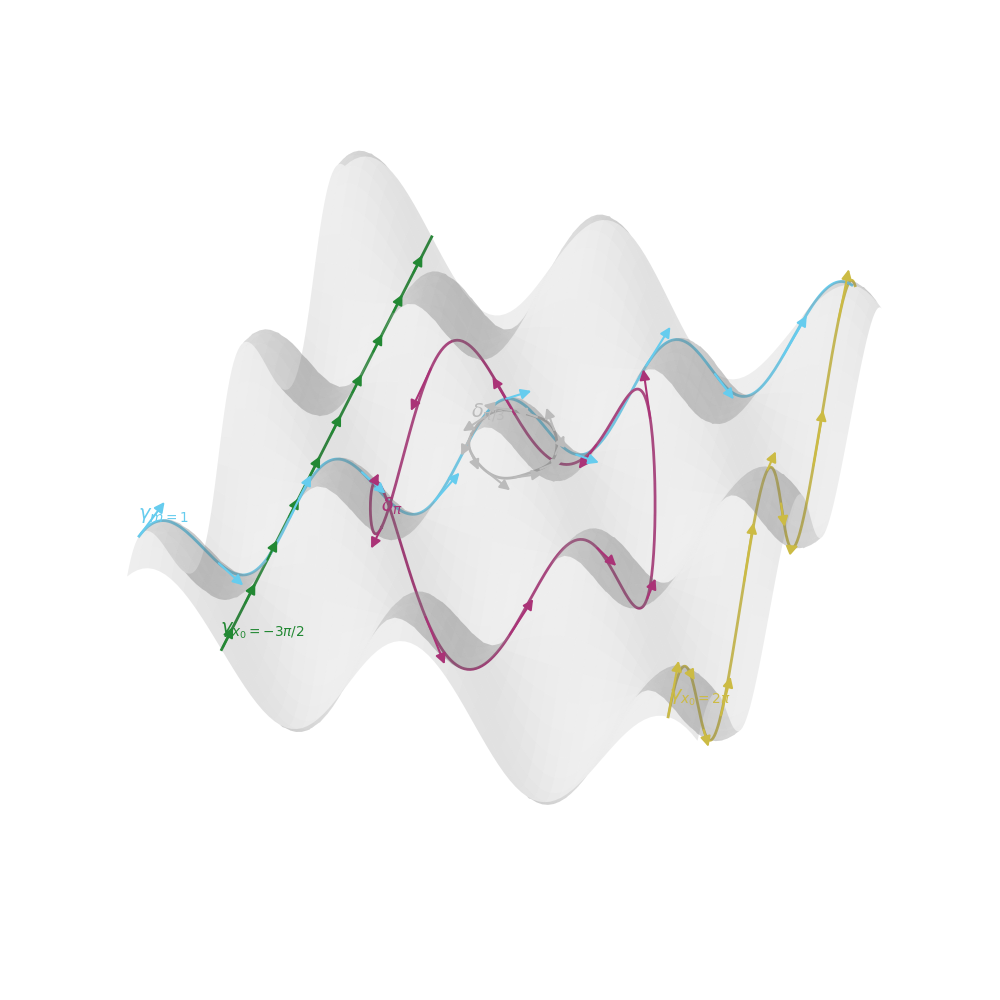

In [7]:
fig, ax = manifold_axes()
for curve, color, label, intervals, _ in curve_list:
    plot_curves.plot_curve_on_manifold(ax=ax, curve=curve, lambda_range=intervals[0], color=color, label=label, label_position="start")
    plot_curves.plot_curve_tangents_on_manifold(ax=ax, curve=curve, lambda_range=intervals[0], n_arrows=10, color=color, scale=0.8, label=None)
ax.view_init(elev=50.0, azim=-70.0)
plt.tight_layout()
plt.show()
fig.savefig(save_dir + "Fig_Example_curves_manifold.pdf")

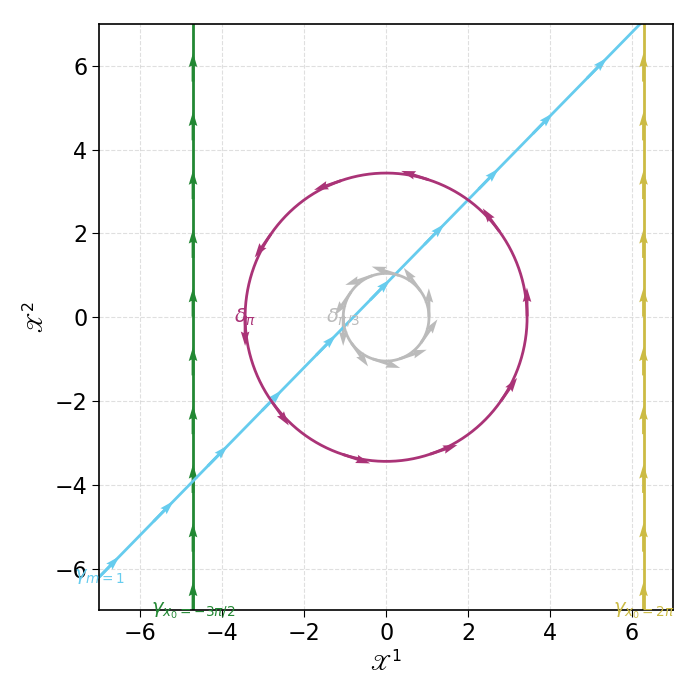

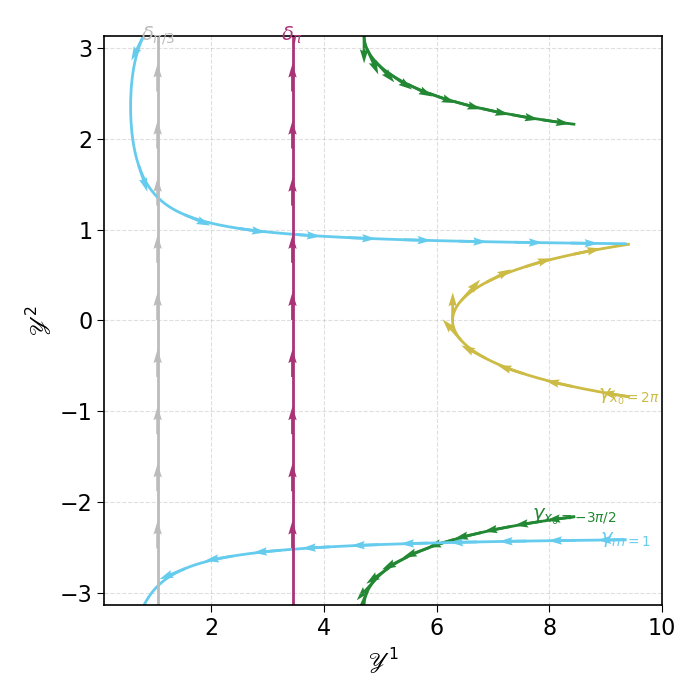

In [8]:
for chart, name, symbol, window in chart_panels:
    fig, ax = plt.subplots(figsize=(7, 7))
    for curve, color, label, intervals_U, intervals_V in curve_list:
        for k, interval in enumerate(intervals_U if name == "U" else intervals_V):
            plot_curves.plot_curve_in_chart(ax=ax, curve=curve, chart=chart, lambda_range=interval, color=color, label=label if k == 0 else None, label_position="start")
            plot_curves.plot_curve_tangents_in_chart(ax=ax, curve=curve, chart=chart, lambda_range=interval, n_arrows=10, color=color, label=None)
    finish_chart_panel(fig, ax, window, symbol, f"Fig_Example_curves_{name}.pdf")

# 3. A scalar field and its differential

$f(p) = c = \cos a \cos b + 1$. At one point $p = \gamma(\lambda_0)$ of each curve, the covector
$(df)_p$ is drawn as its stack of level lines (one per unit of $f$) together with the velocity
$v_{\gamma, p}$ at true scale, so that $v_{\gamma, p}(f) = (df)_p(v_{\gamma, p})$ is the number of
lines the arrow pierces. The components of $(df)_p$ in each chart are
$\partial_i[f \circ \mathscr{X}^{-1}](\mathscr{X}(p))$, computed by `df_components`.

/home/dlopez/tmp/pip-tmp/ipykernel_552821/2862836194.py:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


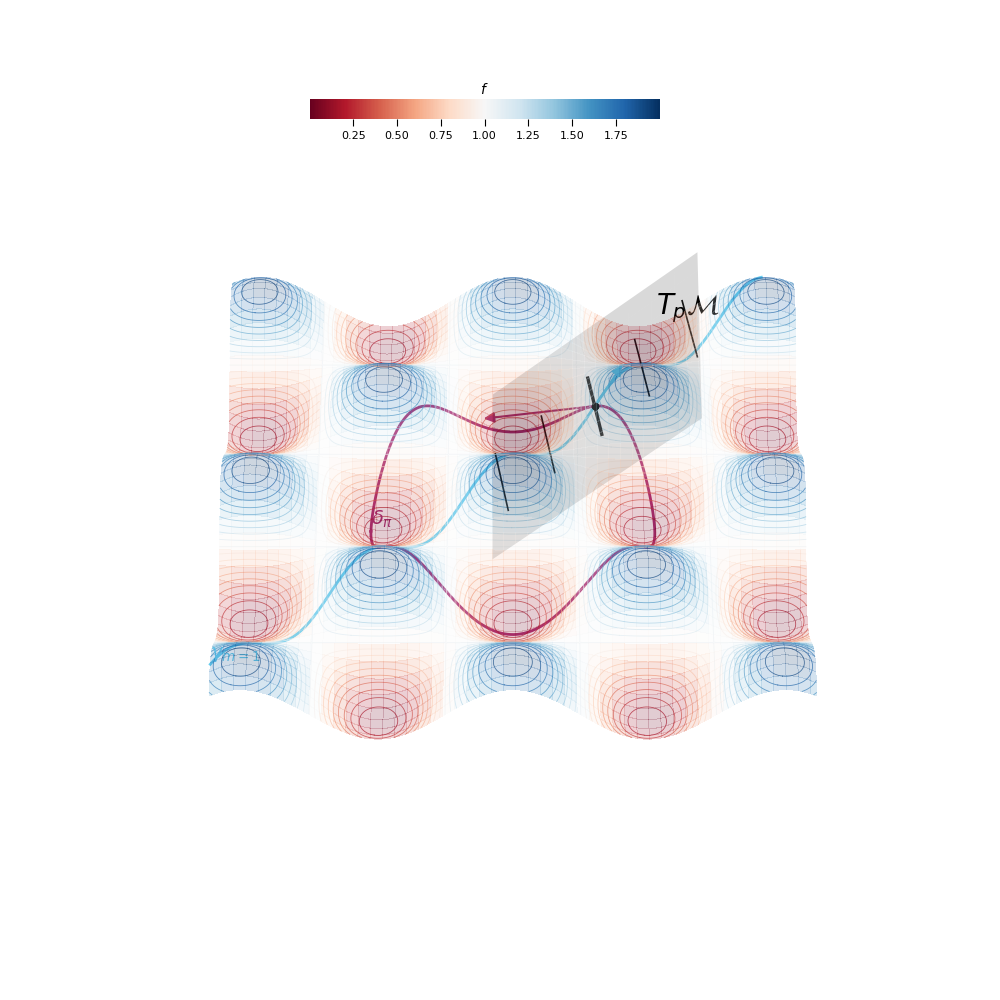

In [9]:
def height(params):
    return embedding(params)[2]

function_f = functions.Function(manifold=manifold, function_parametric=height)

def df_components(chart, param_points):
    """Component functions of df in the dual chart-induced basis: d_i[f o X^{-1}](X(p))."""
    df_in_chart = jax.grad(lambda chart_point: height(chart.inverse_chart_map(chart_point)))
    return jax.vmap(df_in_chart)(jnp.atleast_2d(chart.map_to_chart(param_points)))

# === Point of interest: gamma_line crosses delta_{r0} at p = p_line = delta_{r0}(lambda_p) = gamma_line(0) ===
curves_at_p = [
    # (entry of curve_list, lambda_0 such that curve(lambda_0) = p)
    (curve_list[2], 0.),         # gamma_line(0)          = p
    (curve_list[3], lambda_p),   # delta_{r0}(lambda_p)   = p
]
p_param = p_line

fig, ax = manifold_axes(function=function_f, cmap="RdBu", label_function=r"$f$")

plot_covectors.plot_function_level_sets_on_manifold(
    ax=ax, manifold=manifold, function=function_f, levels=19, resolution=250,
    xmin=-L, xmax=L, ymin=-L, ymax=L, cmap="RdBu", cmap_range=(0.05, 1.0), linestyle="solid", linewidth=0.6, alpha=0.7,
    inset_colorbar=False,
)

for (curve, color, label, intervals, _), lambda_0 in curves_at_p:
    plot_curves.plot_curve_on_manifold(ax=ax, curve=curve, lambda_range=intervals[0], color=color, label=label, label_position="start")
    plot_manifolds.plot_tangent_vectors(
        ax=ax, embedded_points=manifold.embed(p_param[None, :]), colors=[[color]], scale=1.,
        jacobians=curve.directional_derivative_on_manifold(jnp.array([lambda_0]))[:, None, :],
    )
plot_manifolds.plot_tangent_spaces(
    ax=ax, embedded_points=manifold.embed(p_param[None, :]),
    jacobians=manifold.derivatives_at_params(p_param[None, :]),
    size=2.5, colors=["k"], alpha=0.15, labels=[r"$T_p\mathcal{M}$"], label_fontsize=20, label_offset=1.0,
)
plot_covectors.plot_covector_on_manifold(
    ax=ax, manifold=manifold, chart=chart_U, param_point=p_param, components=df_components(chart_U, p_param)[0],
    n_lines=2, extent=1.0, color="k",
)
ax.view_init(elev=45.0, azim=-90.0)
plt.tight_layout()
plt.show()
fig.savefig(save_dir + "Fig_Example_function_manifold.pdf")

chart U: (df)_p = [0.8570081  0.13908494]
    $\gamma_{m=1}$: velocity = [0.70710677 0.70710677],  v(f) = (df)_p(v) = 0.704
    $\delta_{\pi}$: velocity = [-2.8008142  1.9999999],  v(f) = (df)_p(v) = -2.122


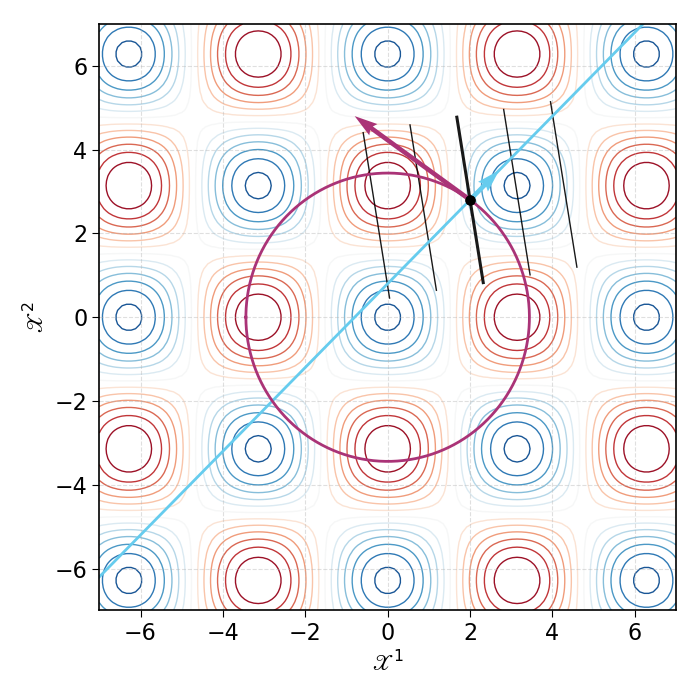

chart V: (df)_p = [ 0.6112191 -2.1221507]
    $\gamma_{m=1}$: velocity = [ 0.98637116 -0.0478077 ],  v(f) = (df)_p(v) = 0.704
    $\delta_{\pi}$: velocity = [0. 1.],  v(f) = (df)_p(v) = -2.122


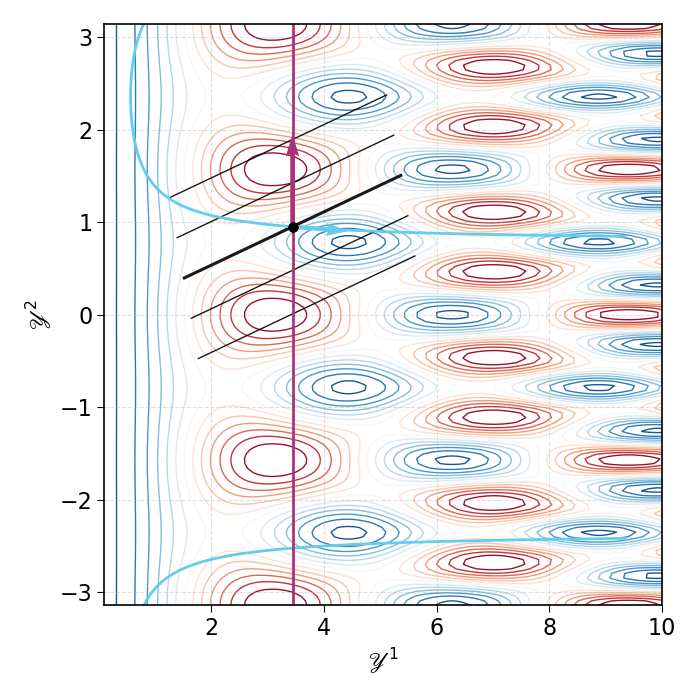

In [10]:
for chart, name, symbol, window in chart_panels:
    fig, ax = plt.subplots(figsize=(7, 7))

    param_points, simplices = chart_sampling(chart, window)
    plot_covectors.plot_function_level_sets_in_chart(
        ax=ax, chart=chart, function=function_f, param_space_data=param_points,
        levels=16, simplices=simplices, cmap="RdBu", linestyles="solid", linewidths=1.0, alpha=1.0, inset_colorbar=False
    )

    # === (df)_p, and the velocity of each curve at p ===
    p_in_chart = chart.map_to_chart(p_param)
    df_at_p = df_components(chart, p_param)[0]
    plot_covectors.plot_covector_in_chart(ax=ax, base_point=p_in_chart, components=df_at_p, n_lines=2, extent=2.0, color="k", annotate_levels=False)
    print(f"chart {name}: (df)_p = {df_at_p}")

    for (curve, color, label, intervals_U, intervals_V), lambda_0 in curves_at_p:
        for interval in (intervals_U if name == "U" else intervals_V):
            plot_curves.plot_curve_in_chart(ax=ax, curve=curve, chart=chart, lambda_range=interval, color=color)
        velocity = curve.derivative_in_chart(chart, jnp.array([lambda_0]))[0]
        plot_covectors.plot_vector_in_chart(ax=ax, base_point=p_in_chart, components=velocity, color=color)
        print(f"    {label}: velocity = {velocity},  v(f) = (df)_p(v) = {jnp.dot(df_at_p, velocity):.3f}")

    finish_chart_panel(fig, ax, window, symbol, f"Fig_Example_function_{name}.pdf")

# 4. Vector fields and their action on $f$

$\mathcal{X}_\gamma$ and $\mathcal{X}_\delta$ assign to each point the velocity of the curve of each
family passing through it: their component functions in $\mathscr{X}$ are $(0, 1)$ and $(-b, a)$.
Each is a frame element of one chart and an honest, non-constant field in the other. Their actions
$\mathcal{X}_\gamma\lfloor f \rceil = -\cos a \sin b$ and
$\mathcal{X}_\delta\lfloor f \rceil = b \sin a \cos b - a \cos a \sin b$ are plotted as scalar fields,
over the level sets of $f$.

In [11]:
field_gamma = fields.VectorField(manifold, lambda params: jnp.array([0., 1.]))
field_delta = fields.VectorField(manifold, lambda params: jnp.stack([-params[1], params[0]]))

field_list = [
    # (field, name, symbol, color, grid resolution)
    (field_gamma, "gamma", r"\mathcal{X}_\gamma", colors[3], 16),
    (field_delta, "delta", r"\mathcal{X}_\delta", colors[4], 16),
]

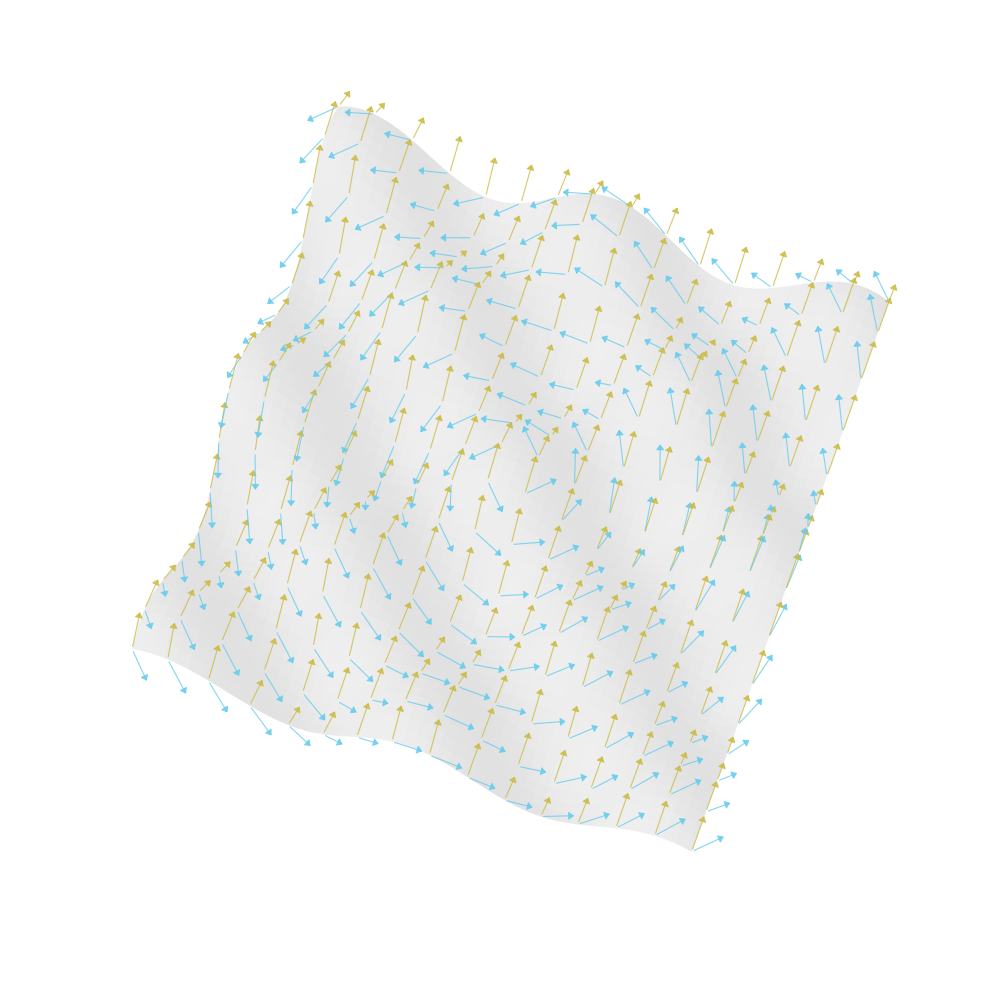

In [17]:
# fig, ax = manifold_axes(function=function_f, cmap="RdBu", label_function=r"$f$")
fig, ax = manifold_axes()

for field, _, _, color, resolution in field_list:
    plot_fields.plot_vector_field_on_manifold(
        ax=ax, field=field, grid_resolution=resolution, xlim=(-L, L), ylim=(-L, L), vector_scale=0.9, color=color
    )
ax.view_init(elev=80.0, azim=-70.0)
plt.tight_layout()
plt.show()
fig.savefig(save_dir + "Fig_Example_fields_manifold.pdf")

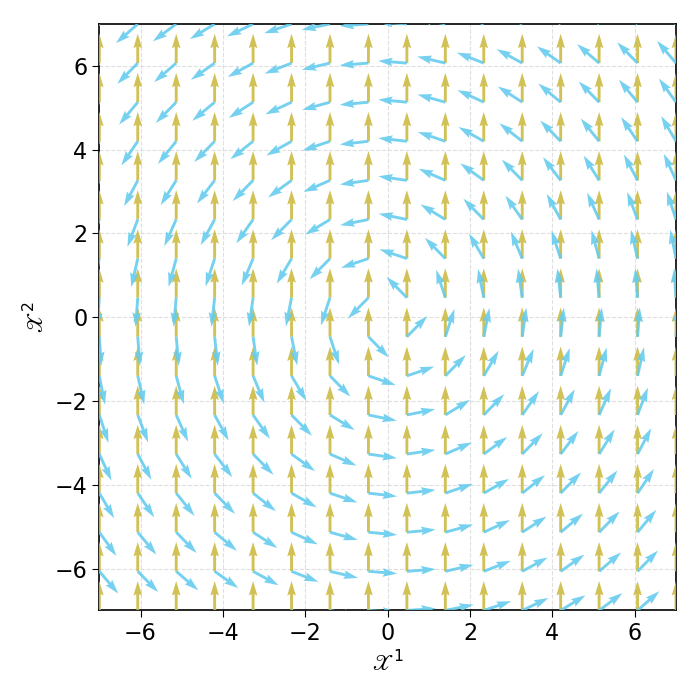

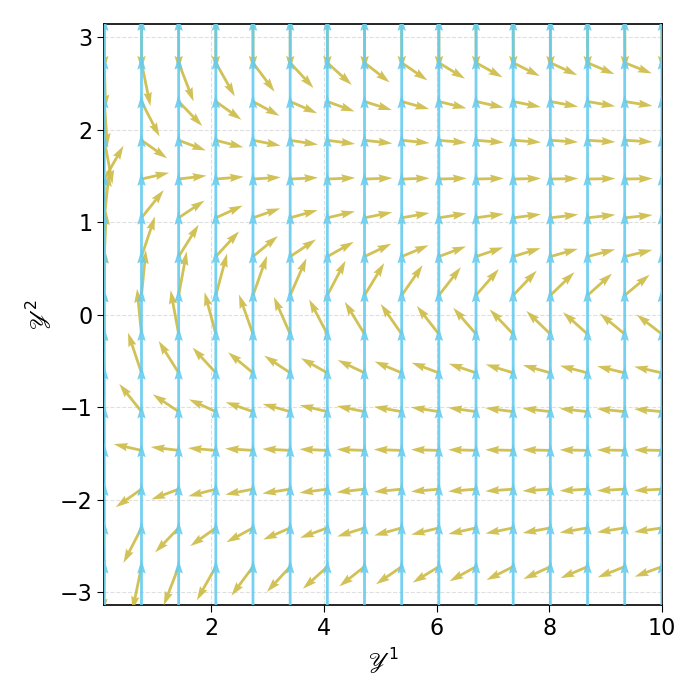

In [13]:
for chart, name, symbol, window in chart_panels:
    fig, ax = plt.subplots(figsize=(7, 7))
    for field, _, _, color, resolution in field_list:
        plot_fields.plot_field_in_chart(
        ax=ax, field=field, chart=chart, xlim=window[0], ylim=window[1],
        grid_resolution=resolution, vector_scale=0.05 * (window[0][1] - window[0][0]), color=color
    )
    finish_chart_panel(fig, ax, window, symbol, f"Fig_Example_fields_{name}.pdf")

/home/dlopez/tmp/pip-tmp/ipykernel_552821/2228430576.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


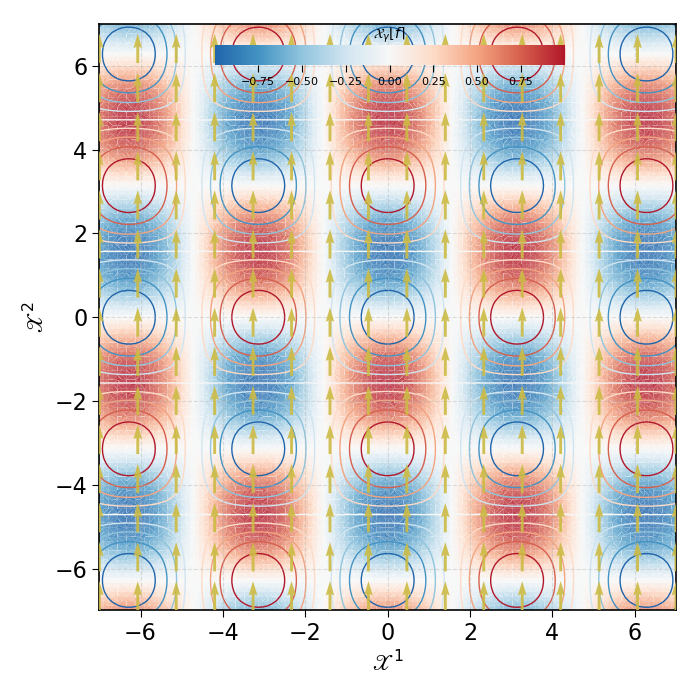

/home/dlopez/tmp/pip-tmp/ipykernel_552821/2228430576.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


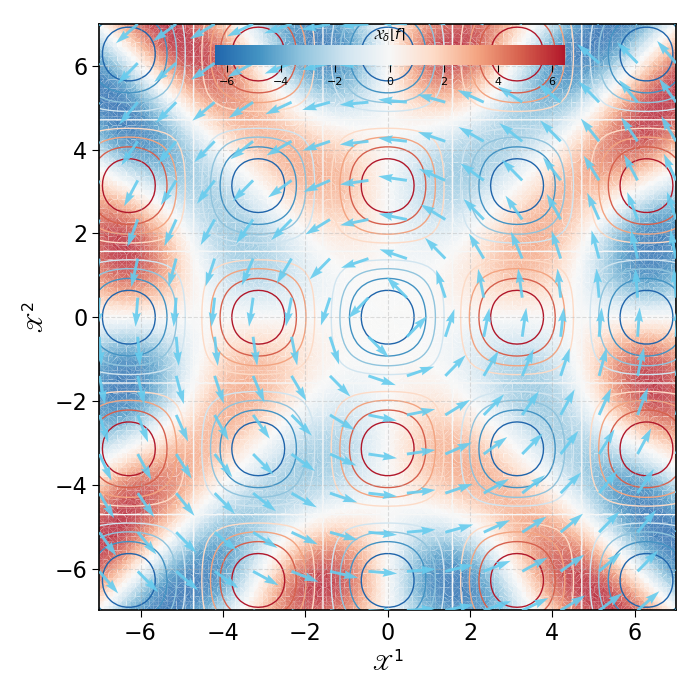

In [14]:
chart, name, symbol, window = chart_panels[0]
param_points, simplices = chart_sampling(chart, window)

for field, field_name, field_symbol, color, resolution in field_list:
    fig, ax = plt.subplots(figsize=(7, 7))
    plot_functions.plot_parametric_function_in_chart_coordinates(
        ax=ax, chart=chart, param_space_data=param_points,
        function_values=field.action_on_function(function_f).evaluate_in_param_space(param_points),
        cmap=tc.BuRd, simplices=simplices, inset_position=(0.2, 0.93), inset_size=(3.5, 0.2),
        label_colorbar=rf"${field_symbol} \lfloor f \rceil$",
    )
    plot_covectors.plot_function_level_sets_in_chart(
        ax=ax, chart=chart, function=function_f, param_space_data=param_points,
        levels=11, simplices=simplices, cmap="RdBu", linestyles="solid", linewidths=1.0, alpha=1.0, inset_colorbar=False
    )
    plot_fields.plot_field_in_chart(ax=ax, field=field, chart=chart, xlim=window[0], ylim=window[1], grid_resolution=resolution, vector_scale=0.7, color=color)
    finish_chart_panel(fig, ax, window, symbol, f"Fig_Example_action_{field_name}_{name}.pdf")

# 5. The covector field $\Theta = df$ and its action on the vector fields

At each sampled point the covector $\Theta(p) = (df)_p$ is represented by its kernel, a short
segment tangent to the level set of $f$ through $p$. The pairings
$\Theta\lceil\mathcal{X}\rfloor = \omega_{\mathcal{V}, i} X^i_\mathcal{V}$ are then computed
**in the chart** $\mathscr{Y}$, contracting the component functions of both fields there: the result is
the same function as $\mathcal{X}\lfloor f \rceil$ in Section 4, i.e.
$df\lceil\mathcal{X}\rfloor = \mathcal{X}\lfloor f \rceil$.

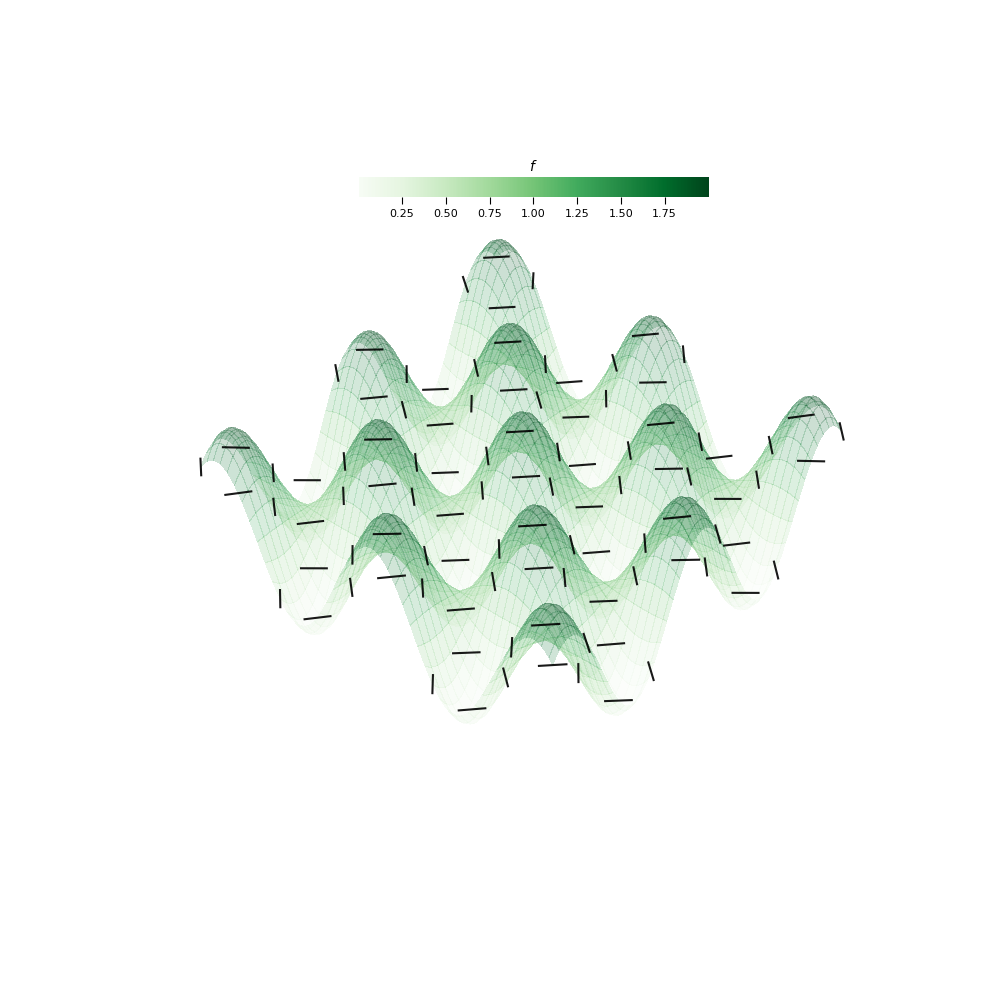

In [15]:
grid_points = plot_fields.param_grid((-L, L), (-L, L), 10)

fig, ax = manifold_axes(function=function_f, cmap="Greens", label_function=r"$f$")
for point, components in zip(grid_points, df_components(chart_U, grid_points)):
    plot_covectors.plot_covector_on_manifold(
        ax=ax, manifold=manifold, chart=chart_U, param_point=point, components=components, n_lines=0, extent=0.4, color="k", zero_linewidth=1.5
    )
plt.show()
fig.savefig(save_dir + "Fig_Example_covector_field_manifold.pdf")

/home/dlopez/tmp/pip-tmp/ipykernel_552821/2228430576.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


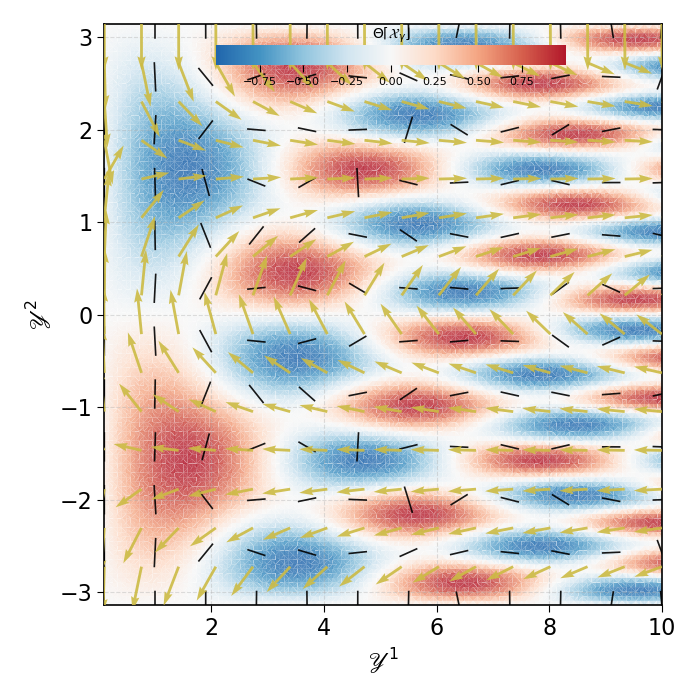

/home/dlopez/tmp/pip-tmp/ipykernel_552821/2228430576.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


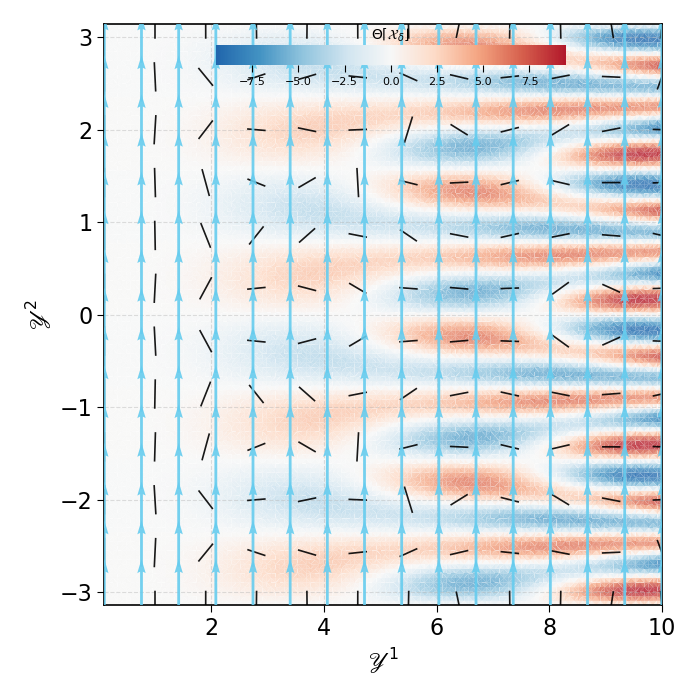

In [16]:
chart, name, symbol, window = chart_panels[1]
param_points, simplices = chart_sampling(chart, window)
omega_V = df_components(chart, param_points)                    # omega_{V, i} at each sampled point

kernel_points = plot_fields.chart_grid_in_param_space(chart, *window, 12)

for field, field_name, field_symbol, color, resolution in field_list:
    fig, ax = plt.subplots(figsize=(7, 7))
    pairing = jnp.sum(omega_V * field.components_in_chart(chart, param_points), axis=1)
    plot_functions.plot_parametric_function_in_chart_coordinates(
        ax=ax, chart=chart, param_space_data=param_points, function_values=pairing,
        cmap=tc.BuRd, simplices=simplices, inset_position=(0.2, 0.93), inset_size=(3.5, 0.2),
        label_colorbar=rf"$\Theta \lceil {field_symbol} \rfloor$",
    )
    for point, components in zip(chart.map_to_chart(kernel_points), df_components(chart, kernel_points)):
        plot_covectors.plot_covector_in_chart(ax=ax, base_point=point, components=components, n_lines=0, extent=0.15, color="k", zero_linewidth=1.2)
    plot_fields.plot_field_in_chart(ax=ax, field=field, chart=chart, xlim=window[0], ylim=window[1], grid_resolution=resolution, vector_scale=0.5, color=color)
    finish_chart_panel(fig, ax, window, symbol, f"Fig_Example_pairing_{field_name}_{name}.pdf")